## The Battle of Neighborhoods: New York City Restaurants
### IBM Data Science Professional Certificate - Applied Data Science Capstone

### Table of Contents

* [Introduction](#chapter1)
* [Data Description](#chapter2)
    * [New York City](#section_2_1)
    * [Foursquare API Data](#section_2_2)
* [Methodology](#method)
    * [Data Preparation and Exploration](#method2)
    * [Cluster Analysis](#method3)
* [Results](#results)
    * [Exploratory Data Analysis](#results1)
    * [Cluster Analysis](#results2)
* [Discussion](#discuss)
* [Conclusion](#conclude)


### Introduction<a class="anchor" id="chapter1"></a>
New York City is a city in the United States of America state of New York. It is the most
populous and densely populated city in the United States. As at 2019, the population of Dallas
was 8,336,817. It is also one of the world’s most populous megacities. New York City is a
diverse city, the most linguistically diverse city in the world with over 800 languages spoken.
As of 2016, it had the largest foreign-born population of any city in the world.

In 2018, NYC & Company found that New York City welcomed a record 65.2 million visitors,
comprising 51.6 million domestic and 13.5 million international visitors, the ninth consecutive
year of tourism growth.
New York is always changing and there seem to be never shortage of things to do. Between
trips of sight seeing the city, you’ll need to eat. I believe it is always very cumbersome task
for a traveller or a visitor to make choices from among the many available options since there
is dense web information. Information is all fragmented that you need to assemble yourself to
make a better decision.
This project seeks to present a guide to the popular cuisines in various neighborhoods
Also, we seek to determine the most popular cuisine in New York and the best restaurant
in neighborhoods There are several cuisines in Dallas, from a gold-themed French spot to Thai
food in the back of a grocery store to an outdoor patio where you can spend a whole day. This
project will seek to provide a great start when you’re trying to make restaurant decisions.


### Data Description<a class="anchor" id="chapter2"></a>
In order to help address this concern, we required geographical location data for New York
City. As a starting point, we needed the latitudes and longitudes of neighborhoods. We used
this data to find restaurants within a certain radius of each neighbourhood.

#### New York City <a class="anchor" id="section_2_1"></a>
New York City data containing the neighborhoods and boroughs, latitudes, and longitudes was
obtained from the data source: https://cocl.us/new york dataset. The data consisted of the
following variables:
 Borough: Name of Borough
 Neighborhood: Name of Neighborhood
 Latitude: Latitude of the neighborhood
 Longitude : Longitude of the neighborhood

#### Foursquare API <a class="anchor" id="section_2_2"></a>
We needed data about restaurants in all neighborhoods of every borough. In order to gain that
information we used "Foursquare" locational information. We connected to the Foursquare API
to gather information about venues inside each and every neighborhood. For each neighborhood,
we chose the radius to be 500 meters.
The data retrieved from Foursquare contained information of venues within a specified distance
of the longitude and latitude of the neighborhoods. The information obtained per venue are as
follows:
 Neighbourhood : Name of Neighbourhood
 Neighbourhood Latitude : Latitude of Neighbourhood
 Neighbourhood Longitude : Longitude of Neighbourhood
 Venue : Venue Name
 ID : ID of the Venue
 Venue Latitude : Latitude of Venue
 Venue Longitude : Longitude of Venue
 Venue Category : Category of Venue

### Methodology<a class="anchor" id="method"></a>
#### Data Preparation and Exploration <a class="anchor" id="method1"></a>

In [118]:
import wikipedia as wk
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
from bs4 import BeautifulSoup
import requests
import numpy as np
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values
from pandas.io.json import json_normalize  # tranform JSON file into a pandas dataframe

import folium # map rendering library

# import k-means from clustering stage
from sklearn.cluster import KMeans

# Matplotlib and associated plotting modules
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
#!pip install plotly 
import plotly.express as px
import plotly.io as pio

#### FourSquare Credentials

In [119]:
# Define Foursquare Credentials and Version

CLIENT_ID = 'YTXTSGGRLKFE3FZRR2NNTNHRAODQZB5UD4ZIYXP04M5JYHAB' 
CLIENT_SECRET = 'KQZVLTNUKOOPK5WAEW4WOJ3F2LVEGW3PEDZIRDB2Q02BWJXJ' 
VERSION = '20201204'

### Create a map of the whole New York City with neighborhoods  

In [120]:
address = 'New York City'

geolocator = Nominatim(user_agent="NY_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

map_ny = folium.Map(location=[latitude, longitude], zoom_start=11)

 # add markers to map
for lat, lng, label in zip(ny_data['Latitude'], ny_data['Longitude'], ny_data['Neighborhood']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_ny) 
    
    
map_ny

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


##### Define function to load new york data and location coordinates

In [121]:
def geo_location(address):
    # get geo location of address
    geolocator = Nominatim(user_agent="foursquare_agent")
    location = geolocator.geocode(address)
    latitude = location.latitude
    longitude = location.longitude
    return latitude,longitude



def get_new_york_data():
    url='https://cocl.us/new_york_dataset'
    resp=requests.get(url).json()
    # all data is present in features label
    features=resp['features']
    # define the dataframe columns
    column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 
    # instantiate the dataframe
    new_york_data = pd.DataFrame(columns=column_names)
    for data in features:
        borough = data['properties']['borough'] 
        neighborhood_name = data['properties']['name']
        neighborhood_latlon = data['geometry']['coordinates']
        neighborhood_lat = neighborhood_latlon[1]
        neighborhood_lon = neighborhood_latlon[0]
        new_york_data = new_york_data.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)
    return new_york_data

In [122]:
ny_data = get_new_york_data()
ny_data.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


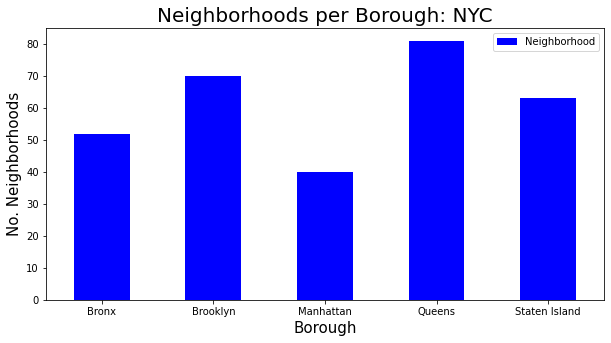

In [123]:
clr = "blue"
ny_data.groupby('Borough')['Neighborhood'].count().plot.bar(figsize=(10,5), color=clr)
plt.title('Neighborhoods per Borough: NYC', fontsize = 20)
plt.xlabel('Borough', fontsize = 15)
plt.ylabel('No. Neighborhoods',fontsize = 15)
plt.xticks(rotation = 'horizontal')
plt.legend()
plt.show()

###### Function to get nearby venues

In [124]:
def getNearbyVenues(names, latitudes, longitudes, radius=1000,LIMIT=100):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        #print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['id'],
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue','ID', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']

    
    return(nearby_venues)

def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [125]:
ny_venues = getNearbyVenues(names=ny_data['Neighborhood'],
                                   latitudes=ny_data['Latitude'],
                                   longitudes=ny_data['Longitude']
                                  )

In [126]:
## Save Data to a csv file
ny_venues.to_csv('ny_venues.csv')
#ny_venues.to_csv("ny_venues2.csv")

In [150]:
# Create a Data-Frame out of it to Concentrate Only on Restaurants 
ny_newd = pd.read_csv('ny_venues.csv')#Load the csv file

NY_Venues_only_restaurant = ny_newd[ny_newd['Venue Category'].str.contains('Restaurant')].reset_index(drop=True)
ny_newd2 = NY_Venues_only_restaurant
NY_Venues_only_restaurant.index = np.arange(1, len(NY_Venues_only_restaurant )+1)
NY_Venues_only_restaurant=NY_Venues_only_restaurant.iloc[:,1:10]

### Load Dataframe to work with

In [151]:
NY_Venues_only_restaurant.head(10)

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,ID,Venue Latitude,Venue Longitude,Venue Category
1,Wakefield,40.894705,-73.847201,Ripe Kitchen & Bar,4d375ce799fe8eec99fd2355,40.898152,-73.838875,Caribbean Restaurant
2,Wakefield,40.894705,-73.847201,Jackie's West Indian Bakery,4c10f6aece57c92804a682d2,40.889283,-73.843310,Caribbean Restaurant
3,Wakefield,40.894705,-73.847201,Ali's Roti Shop,4c9e50e38afca09379b2ff15,40.894036,-73.856935,Caribbean Restaurant
4,Wakefield,40.894705,-73.847201,McDonald's,4be5f0eacf200f47d1fa133c,40.902645,-73.849485,Fast Food Restaurant
5,Wakefield,40.894705,-73.847201,McDonald's,4e4e0e38bd4101d0d7a12e00,40.889435,-73.843369,Fast Food Restaurant
6,Wakefield,40.894705,-73.847201,Hong Kong China King,4edbac4e775bcc53fc0ed5f8,40.889568,-73.842911,Chinese Restaurant
7,Wakefield,40.894705,-73.847201,Mandarin House,4b897beff964a520c43a32e3,40.888139,-73.847119,Chinese Restaurant
8,Wakefield,40.894705,-73.847201,El Mangu Tipico Restaurant,4bec3ac661aca5935cfe8500,40.892891,-73.855825,Spanish Restaurant
9,Wakefield,40.894705,-73.847201,McDonald's,4bc256eb920eb713cd1b1c2c,40.892779,-73.857473,Fast Food Restaurant
10,Co-op City,40.874294,-73.829939,Dumplin Shop,524b6ca6498e92aa03e03ff4,40.876042,-73.835950,Dumpling Restaurant


#### Count of Restaurants in Neighbourhoods in Descending Order

In [152]:
Count_NY=NY_Venues_only_restaurant.groupby('Neighborhood').count().sort_values(ascending=False,by='ID')
Count_NY_Some  = Count_NY.iloc[:,0:1]
Count_NY_Some = Count_NY_Some.rename(columns = {'Neighborhood Latitude':'Number_of_Restaurants'}) 
Count_NY_Some = Count_NY_Some[Count_NY_Some.Number_of_Restaurants>5]
Count_NY.head(15)

,Neighborhood Latitude,Neighborhood Longitude,Venue,ID,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,,
Murray Hill,73,73,73,73,73,73,73
Elmhurst,59,59,59,59,59,59,59
Jackson Heights,52,52,52,52,52,52,52
Woodside,44,44,44,44,44,44,44
Flushing,44,44,44,44,44,44,44
Gramercy,43,43,43,43,43,43,43
Sunnyside Gardens,41,41,41,41,41,41,41
Sunset Park,40,40,40,40,40,40,40
Greenwich Village,37,37,37,37,37,37,37


In [293]:
Count_NY1 = Count_NY.iloc[:,0:1]
Count_NY_Restaurants = NY_Venues_only_restaurant.groupby('Neighborhood').count().iloc[:,0:1]
Count_NY_Restaurants.columns = ['Number of restaturants']
Count_NY_Restaurants.head(10)
Count_NY.iloc[:,1].sum()

4785

In [153]:
###Plot of neighbourhoods with restaurant count > 20
barchart = px.bar(data_frame = Count_NY_Some)
barchart.show()

### Analyze each Neighborhood

In [154]:
# one hot encoding
ny_part_onehot = pd.get_dummies(NY_Venues_only_restaurant[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
ny_part_onehot['Neighborhood'] = NY_Venues_only_restaurant['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [ny_part_onehot.columns[-1]] + list(ny_part_onehot.columns[:-1])
ny_part_onehot = ny_part_onehot[fixed_columns]

ny_part_onehot.head()

,Neighborhood,Afghan Restaurant,African Restaurant,American Restaurant,Arepa Restaurant,Argentinian Restaurant,Asian Restaurant,Australian Restaurant,Austrian Restaurant,Brazilian Restaurant,Burmese Restaurant,Cajun / Creole Restaurant,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Chinese Restaurant,Colombian Restaurant,Comfort Food Restaurant,Cuban Restaurant,Czech Restaurant,Dim Sum Restaurant,Dumpling Restaurant,Eastern European Restaurant,Empanada Restaurant,English Restaurant,Ethiopian Restaurant,Falafel Restaurant,Fast Food Restaurant,Filipino Restaurant,French Restaurant,German Restaurant,Gluten-free Restaurant,Greek Restaurant,Halal Restaurant,Hawaiian Restaurant,Himalayan Restaurant,Hong Kong Restaurant,Hotpot Restaurant,Indian Restaurant,Indonesian Restaurant,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jewish Restaurant,Kebab Restaurant,Korean Restaurant,Kosher Restaurant,Latin American Restaurant,Lebanese Restaurant,Malay Restaurant,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Modern European Restaurant,Modern Greek Restaurant,Molecular Gastronomy Restaurant,Moroccan Restaurant,New American Restaurant,North Indian Restaurant,Paella Restaurant,Pakistani Restaurant,Persian Restaurant,Peruvian Restaurant,Polish Restaurant,Portuguese Restaurant,Puerto Rican Restaurant,Ramen Restaurant,Restaurant,Russian Restaurant,Salvadoran Restaurant,Scandinavian Restaurant,Seafood Restaurant,Shabu-Shabu Restaurant,Shanghai Restaurant,South American Restaurant,Southern / Soul Food Restaurant,Spanish Restaurant,Sri Lankan Restaurant,Sushi Restaurant,Swiss Restaurant,Szechuan Restaurant,Taiwanese Restaurant,Tapas Restaurant,Tex-Mex Restaurant,Thai Restaurant,Theme Restaurant,Tibetan Restaurant,Turkish Restaurant,Udon Restaurant,Ukrainian Restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Vietnamese Restaurant
1,Wakefield,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Wakefield,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Wakefield,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Wakefield,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,Wakefield,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


Next, let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [175]:
ny_part_grouped = ny_part_onehot.groupby('Neighborhood').mean().reset_index()
ny_part_grouped.head()

,Neighborhood,Afghan Restaurant,African Restaurant,American Restaurant,Arepa Restaurant,Argentinian Restaurant,Asian Restaurant,Australian Restaurant,Austrian Restaurant,Brazilian Restaurant,Burmese Restaurant,Cajun / Creole Restaurant,Cantonese Restaurant,Caribbean Restaurant,Caucasian Restaurant,Chinese Restaurant,Colombian Restaurant,Comfort Food Restaurant,Cuban Restaurant,Czech Restaurant,Dim Sum Restaurant,Dumpling Restaurant,Eastern European Restaurant,Empanada Restaurant,English Restaurant,Ethiopian Restaurant,Falafel Restaurant,Fast Food Restaurant,Filipino Restaurant,French Restaurant,German Restaurant,Gluten-free Restaurant,Greek Restaurant,Halal Restaurant,Hawaiian Restaurant,Himalayan Restaurant,Hong Kong Restaurant,Hotpot Restaurant,Indian Restaurant,Indonesian Restaurant,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jewish Restaurant,Kebab Restaurant,Korean Restaurant,Kosher Restaurant,Latin American Restaurant,Lebanese Restaurant,Malay Restaurant,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Modern European Restaurant,Modern Greek Restaurant,Molecular Gastronomy Restaurant,Moroccan Restaurant,New American Restaurant,North Indian Restaurant,Paella Restaurant,Pakistani Restaurant,Persian Restaurant,Peruvian Restaurant,Polish Restaurant,Portuguese Restaurant,Puerto Rican Restaurant,Ramen Restaurant,Restaurant,Russian Restaurant,Salvadoran Restaurant,Scandinavian Restaurant,Seafood Restaurant,Shabu-Shabu Restaurant,Shanghai Restaurant,South American Restaurant,Southern / Soul Food Restaurant,Spanish Restaurant,Sri Lankan Restaurant,Sushi Restaurant,Swiss Restaurant,Szechuan Restaurant,Taiwanese Restaurant,Tapas Restaurant,Tex-Mex Restaurant,Thai Restaurant,Theme Restaurant,Tibetan Restaurant,Turkish Restaurant,Udon Restaurant,Ukrainian Restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Vietnamese Restaurant
0,Allerton,0.0,0.0,0.090909,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.272727,0.0,0.090909,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.272727,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.272727,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Annadale,0.0,0.0,0.500000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Arden Heights,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Arlington,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Arrochar,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.400000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.2,0.000000,0.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

Check the 10 most common restaurants in each neighborhood.

In [262]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    return row_categories_sorted.index.values[0:num_top_venues]

num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = ny_part_grouped['Neighborhood']

for ind in np.arange(ny_part_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(ny_part_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Allerton,Fast Food Restaurant,Mexican Restaurant,Caribbean Restaurant,American Restaurant,Chinese Restaurant,Vietnamese Restaurant,Himalayan Restaurant,Filipino Restaurant,French Restaurant,German Restaurant
1,Annadale,Restaurant,American Restaurant,Hawaiian Restaurant,Ethiopian Restaurant,Falafel Restaurant,Fast Food Restaurant,Filipino Restaurant,French Restaurant,German Restaurant,Gluten-free Restaurant
2,Arden Heights,Italian Restaurant,Mexican Restaurant,Sushi Restaurant,Vietnamese Restaurant,Halal Restaurant,Ethiopian Restaurant,Falafel Restaurant,Fast Food Restaurant,Filipino Restaurant,French Restaurant
3,Arlington,Fast Food Restaurant,Vietnamese Restaurant,Hawaiian Restaurant,Ethiopian Restaurant,Falafel Restaurant,Filipino Restaurant,French Restaurant,German Restaurant,Gluten-free Restaurant,Greek Restaurant
4,Arrochar,Italian Restaurant,Mediterranean Restaurant,Polish Restaurant,Middle Eastern Restaurant,Vietnamese Restaurant,Halal Restaurant,Falafel Restaurant,Fast Food Restaurant,Filipino Restaurant,French Restaurant


##### Most common restaurant among all Neighbourhoods

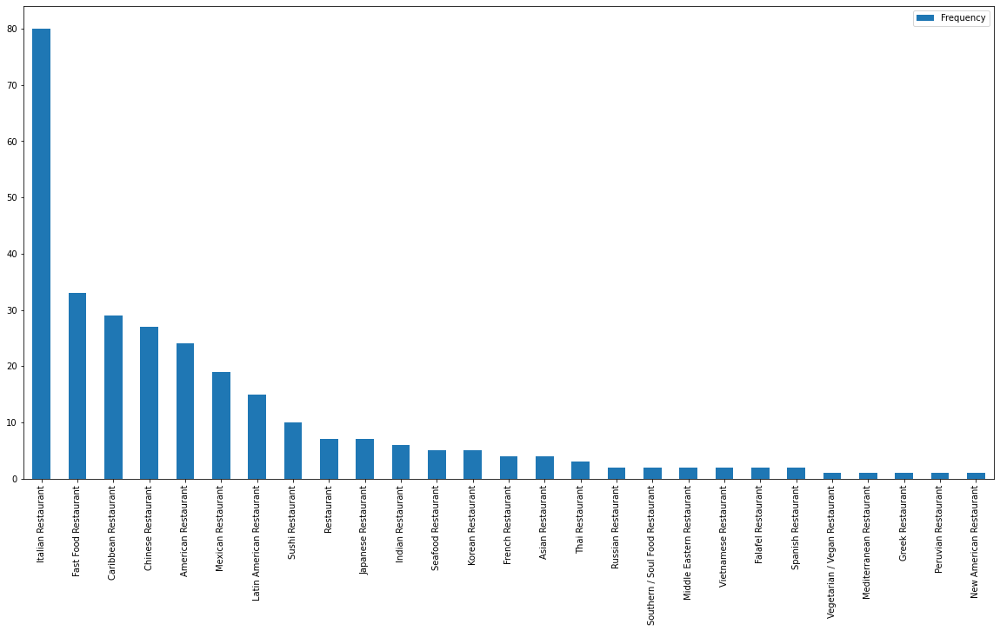

In [245]:
columns = [ 'Frequency']
First_common = pd.DataFrame(neighborhoods_venues_sorted.iloc[:,2].value_counts())
First_common.columns=columns
First_common.plot.bar(figsize=(20,10))

#### 10th Most Common

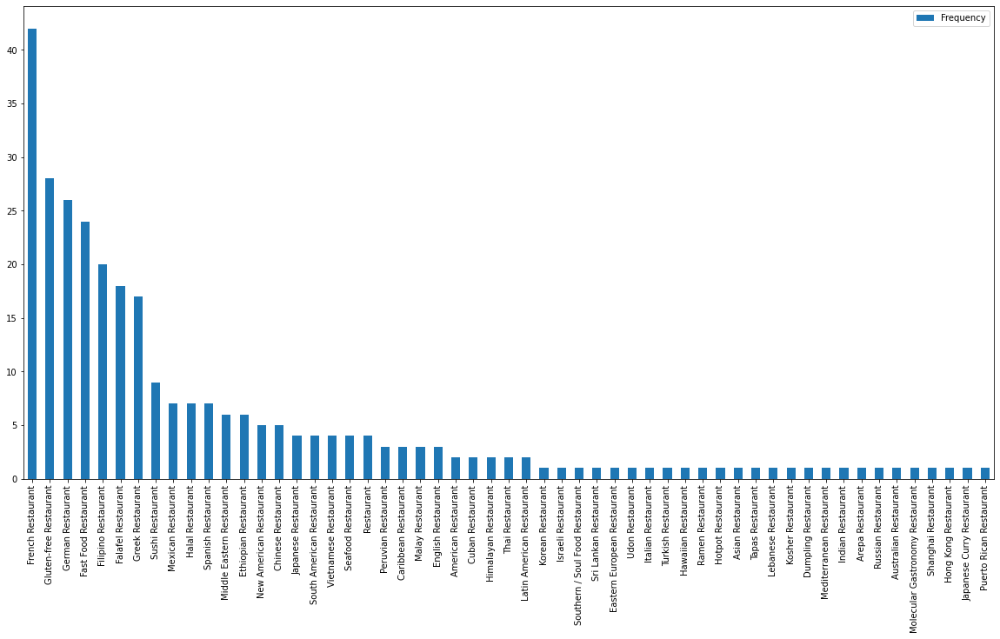

In [290]:
columns = [ 'Frequency']
ten_common = pd.DataFrame(neighborhoods_venues_sorted.iloc[:,-1].value_counts())
ten_common.columns=columns
ten_common.plot.bar(figsize=(20,10))

##### Cluster Analysis <a class="anchor" id="method2"></a>
We performed the clustering analysis on the data by using the K-means clustering algorithm.
This unsupervised machine learning technique was prefered for this analysis, since we seek to
cluster the neighborhoods based on restaurants. For this algorithm, we need to decide on the
number of clusters (K) that we want to use. To avoid trail and error approach, the silhouette
scores was used. The following graph shows the silhouette scores for a range of cluster variations

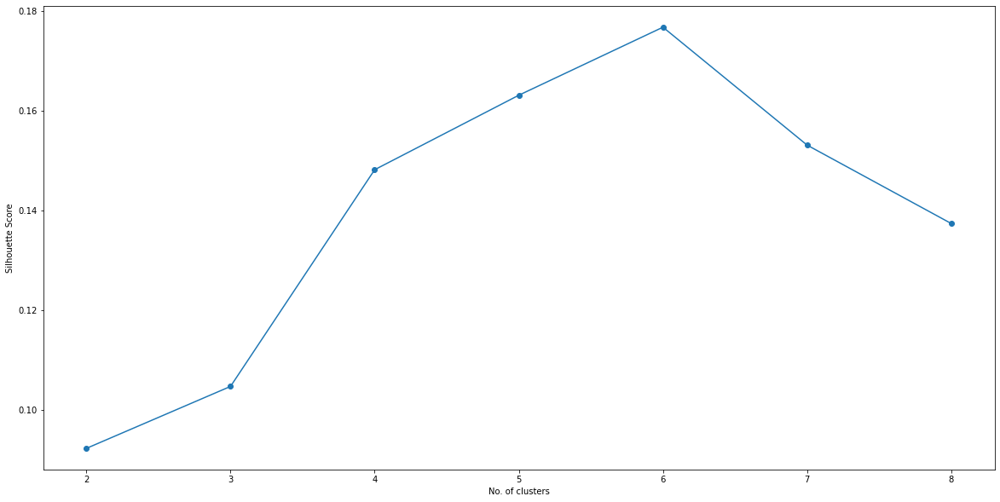

In [141]:
def plot(x, y, xlabel, ylabel):
    plt.figure(figsize=(20,10))
    plt.plot(np.arange(2, x), y, 'o-')
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.xticks(np.arange(2, x))
    plt.show()
    
max_range = 9

#budapest_grouped_clustering = budapest_grouped.drop('Neighborhood', 1)
ny_part_grouped_clustering = ny_part_grouped.drop('Neighborhood', 1)

from sklearn.metrics import silhouette_samples, silhouette_score

indices = []
scores = []

for kclusters in range(2, max_range) :
    
    # Run k-means clustering
    kmc = ny_part_grouped_clustering
    kmeans = KMeans(n_clusters = kclusters, init = 'k-means++', random_state = 3).fit_predict(kmc)
    
    # Gets the score for the clustering operation performed
    score = silhouette_score(kmc, kmeans)
    
    # Appending the index and score to the respective lists
    indices.append(kclusters)
    scores.append(score)
plot(max_range, scores, "No. of clusters", "Silhouette Score")

### Results <a class="anchor" id="results"></a>
### Cluster Analysis <a class="anchor" id="results2"></a>

In [ ]:
ny_part_grouped_clustering = ny_part_grouped.drop('Neighborhood', 1)

In [189]:
# set number of clusters
kclusters = 6

#ny_part_grouped_clustering = ny_part_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(ny_part_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[1:10]

array([0, 3, 1, 3, 2, 0, 3, 0, 0])

In [191]:
# add clustering labels
#neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

ny_part_merged = NY_Venues_only_restaurant

ny_part_merged = ny_part_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

ny_part_merged.tail(10) # check the last columns!

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,ID,Venue Latitude,Venue Longitude,Venue Category,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
4776,Queensbridge,40.756091,-73.945631,Five Star Banquet,4b1b341bf964a5208af923e3,40.750820,-73.945784,Indian Restaurant,0,Italian Restaurant,Restaurant,Greek Restaurant,Indian Restaurant,Japanese Restaurant
4777,Queensbridge,40.756091,-73.945631,Aunt Rosie's Restaurant,4bfd4dc1e529c92821b3ba8c,40.750440,-73.949002,American Restaurant,0,Italian Restaurant,Restaurant,Greek Restaurant,Indian Restaurant,Japanese Restaurant
4778,Queensbridge,40.756091,-73.945631,Oro Restaurant and Lounge,57a13096498e42182b7df641,40.751803,-73.939319,Italian Restaurant,0,Italian Restaurant,Restaurant,Greek Restaurant,Indian Restaurant,Japanese Restaurant
4779,Queensbridge,40.756091,-73.945631,Fortune Cookie Restaurant,4af1bed1f964a520bae221e3,40.747786,-73.947451,Chinese Restaurant,0,Italian Restaurant,Restaurant,Greek Restaurant,Indian Restaurant,Japanese Restaurant
4780,Queensbridge,40.756091,-73.945631,Chickpea,50a1557ec84caf44ec5574d7,40.749644,-73.939252,Mediterranean Restaurant,0,Italian Restaurant,Restaurant,Greek Restaurant,Indian Restaurant,Japanese Restaurant
4781,Queensbridge,40.756091,-73.945631,Fuji East,4a6e0664f964a520acd31fe3,40.758966,-73.952441,Japanese Restaurant,0,Italian Restaurant,Restaurant,Greek Restaurant,Indian Restaurant,Japanese Restaurant
4782,Fox Hills,40.617311,-74.081740,El Pollo Restaurant,4b65f266f964a520530a2be3,40.612991,-74.087308,Spanish Restaurant,5,Spanish Restaurant,Indian Restaurant,Chinese Restaurant,Vietnamese Restaurant,Halal Restaurant
4783,Fox Hills,40.617311,-74.081740,Campo Bello Restaurante,4cfc0726c6cca35dcc808f32,40.624463,-74.079652,Spanish Restaurant,5,Spanish Restaurant,Indian Restaurant,Chinese Restaurant,Vietnamese Restaurant,Halal Restaurant
4784,Fox Hills,40.617311,-74.081740,Al-Humza,4b65f2e3f964a5206e0a2be3,40.611311,-74.088900,Indian Restaurant,5,Spanish Restaurant,Indian Restaurant,Chinese Restaurant,Vietnamese Restaurant,Halal Restaurant
4785,Fox Hills,40.617311,-74.081740,Kum Fung Kitchen,4cf9aa7ad8468cfadaa9e86b,40.621842,-74.072305,Chinese Restaurant,5,Spanish Restaurant,Indian Restaurant,Chinese Restaurant,Vietnamese Restaurant,Halal Restaurant


In [192]:
map_clusters = folium.Map(location=[latitude,longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(
        ny_part_merged['Neighborhood Latitude'], 
        ny_part_merged['Neighborhood Longitude'], 
        ny_part_merged['Neighborhood'], 
        ny_part_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

### Examine Clusters

Cluster 1

In [249]:
Cluster1 = ny_part_merged.loc[ny_part_merged['Cluster Labels'] == 0, ny_part_merged.columns[[0] + list(range(8, ny_part_merged.shape[1]))]]
Cluster1

,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
41,Riverdale,0,Japanese Restaurant,Mexican Restaurant,Greek Restaurant,Italian Restaurant,Thai Restaurant
42,Riverdale,0,Japanese Restaurant,Mexican Restaurant,Greek Restaurant,Italian Restaurant,Thai Restaurant
43,Riverdale,0,Japanese Restaurant,Mexican Restaurant,Greek Restaurant,Italian Restaurant,Thai Restaurant
44,Riverdale,0,Japanese Restaurant,Mexican Restaurant,Greek Restaurant,Italian Restaurant,Thai Restaurant
45,Riverdale,0,Japanese Restaurant,Mexican Restaurant,Greek Restaurant,Italian Restaurant,Thai Restaurant
46,Riverdale,0,Japanese Restaurant,Mexican Restaurant,Greek Restaurant,Italian Restaurant,Thai Restaurant
47,Riverdale,0,Japanese Restaurant,Mexican Restaurant,Greek Restaurant,Italian Restaurant,Thai Restaurant
48,Riverdale,0,Japanese Restaurant,Mexican Restaurant,Greek Restaurant,Italian Restaurant,Thai Restaurant
49,Riverdale,0,Japanese Restaurant,Mexican Restaurant,Greek Restaurant,Italian Restaurant,Thai Restaurant
84,Woodlawn,0,American Restaurant,Italian Restaurant,Caribbean Restaurant,Fast Food Restaurant,Indian Restaurant


In [212]:
print('There are {} unique categories.'.format(len(Cluster1.iloc[:,2].unique())))

There are 25 unique categories.


In [271]:
columns = [ 'Frequency']
cluster1_most_common = pd.DataFrame(Cluster1.iloc[:,2].value_counts())
#First_common.columns=columns
#First_common.plot.bar(figsize=(20,10))
cluster1_most_common.columns = columns
cluster1_most_common.head(10)

,Frequency
Italian Restaurant,649
American Restaurant,350
Mexican Restaurant,239
Korean Restaurant,188
Sushi Restaurant,173
Chinese Restaurant,159
Japanese Restaurant,138
French Restaurant,87
Indian Restaurant,65
Vietnamese Restaurant,59


Cluster 2

In [275]:
cluster2 = ny_part_merged.loc[ny_part_merged['Cluster Labels'] == 1, ny_part_merged.columns[[0] + list(range(8, ny_part_merged.shape[1]))]]
cluster2

,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
215,East Tremont,1,Fast Food Restaurant,American Restaurant,Puerto Rican Restaurant,Vietnamese Restaurant,Hawaiian Restaurant
216,East Tremont,1,Fast Food Restaurant,American Restaurant,Puerto Rican Restaurant,Vietnamese Restaurant,Hawaiian Restaurant
217,East Tremont,1,Fast Food Restaurant,American Restaurant,Puerto Rican Restaurant,Vietnamese Restaurant,Hawaiian Restaurant
218,East Tremont,1,Fast Food Restaurant,American Restaurant,Puerto Rican Restaurant,Vietnamese Restaurant,Hawaiian Restaurant
219,East Tremont,1,Fast Food Restaurant,American Restaurant,Puerto Rican Restaurant,Vietnamese Restaurant,Hawaiian Restaurant
220,East Tremont,1,Fast Food Restaurant,American Restaurant,Puerto Rican Restaurant,Vietnamese Restaurant,Hawaiian Restaurant
221,West Farms,1,Fast Food Restaurant,Puerto Rican Restaurant,Vietnamese Restaurant,Hawaiian Restaurant,Falafel Restaurant
222,West Farms,1,Fast Food Restaurant,Puerto Rican Restaurant,Vietnamese Restaurant,Hawaiian Restaurant,Falafel Restaurant
223,West Farms,1,Fast Food Restaurant,Puerto Rican Restaurant,Vietnamese Restaurant,Hawaiian Restaurant,Falafel Restaurant
265,Longwood,1,Fast Food Restaurant,Latin American Restaurant,Mexican Restaurant,Spanish Restaurant,Chinese Restaurant


In [276]:
print('There are {} unique categories.'.format(len(cluster2.iloc[:,2].unique())))

There are 2 unique categories.


In [280]:
cluster2_most_common = pd.DataFrame(cluster2.iloc[:,0].value_counts())
#First_common.columns=columns
#First_common.plot.bar(figsize=(20,10))
cluster2_most_common.columns= columns
cluster2_most_common.head(10)

,Frequency
Longwood,15
Morrisania,14
Richmond Valley,12
Mount Hope,10
New Lots,10
Cypress Hills,9
Soundview,8
Highland Park,6
East Tremont,6
Brookville,3


Cluster 3

In [223]:
cluster3=ny_part_merged.loc[ny_part_merged['Cluster Labels'] == 2, ny_part_merged.columns[[0] + list(range(8, ny_part_merged.shape[1]))]]
cluster3

,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
1,Wakefield,2,Caribbean Restaurant,Fast Food Restaurant,Chinese Restaurant,Spanish Restaurant,Vietnamese Restaurant
2,Wakefield,2,Caribbean Restaurant,Fast Food Restaurant,Chinese Restaurant,Spanish Restaurant,Vietnamese Restaurant
3,Wakefield,2,Caribbean Restaurant,Fast Food Restaurant,Chinese Restaurant,Spanish Restaurant,Vietnamese Restaurant
4,Wakefield,2,Caribbean Restaurant,Fast Food Restaurant,Chinese Restaurant,Spanish Restaurant,Vietnamese Restaurant
5,Wakefield,2,Caribbean Restaurant,Fast Food Restaurant,Chinese Restaurant,Spanish Restaurant,Vietnamese Restaurant
6,Wakefield,2,Caribbean Restaurant,Fast Food Restaurant,Chinese Restaurant,Spanish Restaurant,Vietnamese Restaurant
7,Wakefield,2,Caribbean Restaurant,Fast Food Restaurant,Chinese Restaurant,Spanish Restaurant,Vietnamese Restaurant
8,Wakefield,2,Caribbean Restaurant,Fast Food Restaurant,Chinese Restaurant,Spanish Restaurant,Vietnamese Restaurant
9,Wakefield,2,Caribbean Restaurant,Fast Food Restaurant,Chinese Restaurant,Spanish Restaurant,Vietnamese Restaurant
23,Eastchester,2,Caribbean Restaurant,Fast Food Restaurant,Asian Restaurant,Seafood Restaurant,Chinese Restaurant


In [214]:
print('There are {} unique categories.'.format(len(cluster3.iloc[:,2].unique())))

There are 4 unique categories.


In [282]:
cluster3_most_common = pd.DataFrame(cluster3.iloc[:,0].value_counts())
#First_common.columns=columns
#First_common.plot.bar(figsize=(20,10))
cluster3_most_common.columns= columns
cluster3_most_common.head(10)

,Frequency
Prospect Park South,32
Prospect Lefferts Gardens,31
Rugby,17
Remsen Village,17
Erasmus,15
Williamsbridge,13
Eastchester,12
Flatlands,11
Wingate,10
Edenwald,10


Cluster 4

In [224]:
cluster4=ny_part_merged.loc[ny_part_merged['Cluster Labels'] == 3, ny_part_merged.columns[[0] + list(range(8, ny_part_merged.shape[1]))]]
cluster4

,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
130,Pelham Parkway,3,Italian Restaurant,Restaurant,Chinese Restaurant,Mexican Restaurant,Eastern European Restaurant
131,Pelham Parkway,3,Italian Restaurant,Restaurant,Chinese Restaurant,Mexican Restaurant,Eastern European Restaurant
132,Pelham Parkway,3,Italian Restaurant,Restaurant,Chinese Restaurant,Mexican Restaurant,Eastern European Restaurant
133,Pelham Parkway,3,Italian Restaurant,Restaurant,Chinese Restaurant,Mexican Restaurant,Eastern European Restaurant
134,Pelham Parkway,3,Italian Restaurant,Restaurant,Chinese Restaurant,Mexican Restaurant,Eastern European Restaurant
135,Pelham Parkway,3,Italian Restaurant,Restaurant,Chinese Restaurant,Mexican Restaurant,Eastern European Restaurant
136,Pelham Parkway,3,Italian Restaurant,Restaurant,Chinese Restaurant,Mexican Restaurant,Eastern European Restaurant
137,Pelham Parkway,3,Italian Restaurant,Restaurant,Chinese Restaurant,Mexican Restaurant,Eastern European Restaurant
138,Pelham Parkway,3,Italian Restaurant,Restaurant,Chinese Restaurant,Mexican Restaurant,Eastern European Restaurant
139,Pelham Parkway,3,Italian Restaurant,Restaurant,Chinese Restaurant,Mexican Restaurant,Eastern European Restaurant


In [216]:
print('There are {} unique categories.'.format(len(cluster4.iloc[:,2].unique())))

There are 4 unique categories.


In [284]:
cluster4_most_common = pd.DataFrame(cluster4.iloc[:,0].value_counts())
#First_common.columns=columns
#First_common.plot.bar(figsize=(20,10))
cluster4_most_common.columns= columns
cluster4_most_common.head(10)

,Frequency
Greenwich Village,37
West Village,36
Lenox Hill,29
Soho,27
Belmont,26
Upper East Side,26
Little Neck,25
Fordham,25
Douglaston,24
Cobble Hill,23


Cluster 5

In [225]:
cluster5=ny_part_merged.loc[ny_part_merged['Cluster Labels'] == 4, ny_part_merged.columns[[0] + list(range(8, ny_part_merged.shape[1]))]]
cluster5

,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
1122,East New York,4,Chinese Restaurant,Caribbean Restaurant,Spanish Restaurant,Vietnamese Restaurant,Falafel Restaurant
1123,East New York,4,Chinese Restaurant,Caribbean Restaurant,Spanish Restaurant,Vietnamese Restaurant,Falafel Restaurant
1124,East New York,4,Chinese Restaurant,Caribbean Restaurant,Spanish Restaurant,Vietnamese Restaurant,Falafel Restaurant
1125,East New York,4,Chinese Restaurant,Caribbean Restaurant,Spanish Restaurant,Vietnamese Restaurant,Falafel Restaurant
1302,Sea Gate,4,American Restaurant,Chinese Restaurant,Vietnamese Restaurant,Hawaiian Restaurant,Falafel Restaurant
1303,Sea Gate,4,American Restaurant,Chinese Restaurant,Vietnamese Restaurant,Hawaiian Restaurant,Falafel Restaurant
3187,Far Rockaway,4,Chinese Restaurant,Fast Food Restaurant,Caribbean Restaurant,Vietnamese Restaurant,English Restaurant
3188,Far Rockaway,4,Chinese Restaurant,Fast Food Restaurant,Caribbean Restaurant,Vietnamese Restaurant,English Restaurant
3189,Far Rockaway,4,Chinese Restaurant,Fast Food Restaurant,Caribbean Restaurant,Vietnamese Restaurant,English Restaurant
3190,Far Rockaway,4,Chinese Restaurant,Fast Food Restaurant,Caribbean Restaurant,Vietnamese Restaurant,English Restaurant


In [218]:
print('There are {} unique categories.'.format(len(cluster5.iloc[:,2].unique())))

There are 2 unique categories.


In [286]:
cluster5_most_common = pd.DataFrame(cluster5.iloc[:,0].value_counts())
#First_common.columns=columns
#First_common.plot.bar(figsize=(20,10))
cluster5_most_common.columns= columns
cluster5_most_common.head(10)

,Frequency
Queensboro Hill,16
Willowbrook,8
Malba,6
Manor Heights,6
Far Rockaway,5
East New York,4
Sea Gate,2
Prince's Bay,2
Broad Channel,1
Bayswater,1


Cluster 6

In [226]:
cluster6=ny_part_merged.loc[ny_part_merged['Cluster Labels'] == 5, ny_part_merged.columns[[0] + list(range(8, ny_part_merged.shape[1]))]]
cluster6

,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
10,Co-op City,5,Caribbean Restaurant,Chinese Restaurant,Fast Food Restaurant,Mexican Restaurant,Restaurant
11,Co-op City,5,Caribbean Restaurant,Chinese Restaurant,Fast Food Restaurant,Mexican Restaurant,Restaurant
12,Co-op City,5,Caribbean Restaurant,Chinese Restaurant,Fast Food Restaurant,Mexican Restaurant,Restaurant
13,Co-op City,5,Caribbean Restaurant,Chinese Restaurant,Fast Food Restaurant,Mexican Restaurant,Restaurant
14,Co-op City,5,Caribbean Restaurant,Chinese Restaurant,Fast Food Restaurant,Mexican Restaurant,Restaurant
15,Co-op City,5,Caribbean Restaurant,Chinese Restaurant,Fast Food Restaurant,Mexican Restaurant,Restaurant
16,Co-op City,5,Caribbean Restaurant,Chinese Restaurant,Fast Food Restaurant,Mexican Restaurant,Restaurant
17,Co-op City,5,Caribbean Restaurant,Chinese Restaurant,Fast Food Restaurant,Mexican Restaurant,Restaurant
18,Co-op City,5,Caribbean Restaurant,Chinese Restaurant,Fast Food Restaurant,Mexican Restaurant,Restaurant
19,Co-op City,5,Caribbean Restaurant,Chinese Restaurant,Fast Food Restaurant,Mexican Restaurant,Restaurant


In [220]:
print('There are {} unique categories.'.format(len(cluster6.iloc[:,2].unique())))

There are 13 unique categories.


In [288]:
cluster6_most_common = pd.DataFrame(cluster6.iloc[:,2].value_counts())
#First_common.columns=columns
#First_common.plot.bar(figsize=(20,10))
cluster6_most_common.columns= columns
cluster6_most_common.head(10)

,Frequency
Latin American Restaurant,205
Fast Food Restaurant,202
Mexican Restaurant,186
Caribbean Restaurant,160
Chinese Restaurant,153
Indian Restaurant,61
Italian Restaurant,22
Restaurant,19
Middle Eastern Restaurant,12
Asian Restaurant,11
